In [1]:
import skimage.io as skio
import matplotlib.pyplot as plt
from tensorflow import float32  
import IPython.display as display
import skimage

import tensorflow as tf
import tensorflow_io as tfio
from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
import matplotlib.pyplot as plt

from skimage.io import imread
import imageio
import numpy as np

In [2]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

im_train_slice    = skio.imread('data/train/*/slice/*.tif')
im_train_bone    = skio.imread('data/train/*/bone/*.tif')
im_train_overlay    = skio.imread('data/train/*/overlay/*.tif')

im_test_slice    = skio.imread('data/test/*/slice/*.tif')
im_test_bone    = skio.imread('data/test/*/bone/*.tif')
im_test_overlay    = skio.imread('data/test/*/overlay/*.tif')
print(repr(im_train_slice)[:100]+"...")

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
 ...


In [3]:
from skimage.io import imsave, imread
im = im_train_slice[0]

In [4]:
im_train_slice.shape

(220, 512, 512)

In [6]:
def display(display_list):
    plt.figure(figsize=(128, 128))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


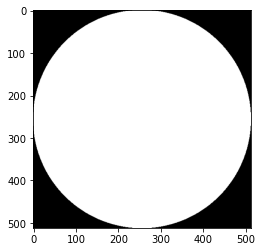

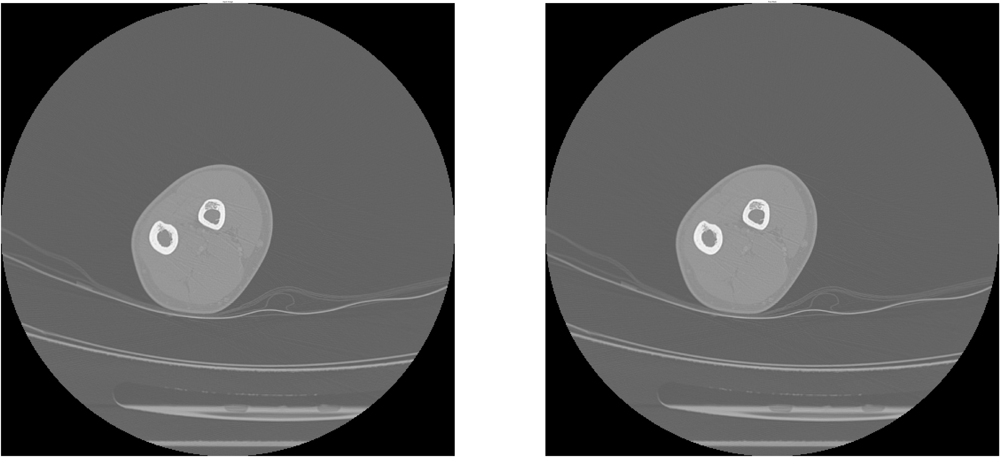

In [7]:
plt.imshow(im_train_slice0)
plt.show()
display([im_train_slice0, im_train_slice0])

In [8]:
im_train_slice = skimage.color.gray2rgb(im_train_slice)
im_test_slice = skimage.color.gray2rgb(im_test_slice)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


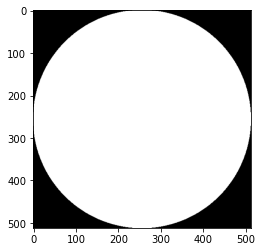

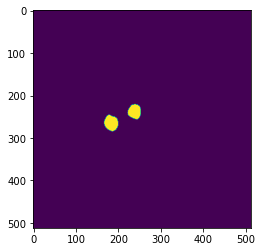

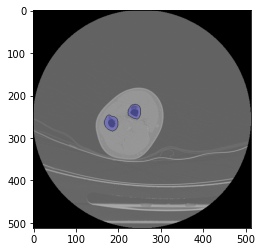

In [9]:
plt.imshow(im_train_slice[0])
plt.show()
plt.imshow(im_train_bone[0])
plt.show()
plt.imshow(im_train_overlay[0])
plt.show()

In [10]:
print(im_train_slice.shape)
print(im_train_bone.shape)

(220, 512, 512, 3)
(220, 512, 512)


In [11]:
print(len(im_test_slice))

50


In [12]:
#First, we need to resize the images and masks to 128x128:
def resize(input_image, input_mask):
    input_image = skimage.transform.resize(input_image, (len(input_image),512, 512))
    input_mask = skimage.transform.resize(input_mask, (len(input_mask),512, 512,1))
    return input_image, input_mask

In [13]:
def augment(input_image, input_mask):
    if tf.random.uniform(()) > 0.5:
        # Random flipping of the image and mask
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)
    return input_image, input_mask

In [14]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) #/ 255.0
    input_mask = tf.cast(input_mask>0, tf.float32)
    return input_image, input_mask

In [15]:
def load_image_train(input_image,input_mask):
    input_image, input_mask = resize(input_image, input_mask)
    #input_image, input_mask = augment(input_image, input_mask)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask
def load_image_test(input_image,input_mask):
    input_image, input_mask = resize(input_image, input_mask)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

In [16]:
np.shape (im_train_slice)
import skimage.transform

In [17]:
train_dataset_input_image,train_dataset_input_mask = load_image_train(im_train_slice,im_train_bone)
test_dataset_input_image,test_dataset_input_mask = load_image_test(im_test_slice,im_test_bone)

In [18]:
print(train_dataset_input_image.shape)
print(train_dataset_input_mask.shape)

(220, 512, 512, 3)
(220, 512, 512, 1)


In [19]:
print(train_dataset_input_mask.shape)
sample_image, sample_mask = train_dataset_input_image[100], train_dataset_input_mask[100]
# for i in range(len(sample_mask)):
#     for j in range(len(sample_mask[i])):
#         if(sample_mask[i][j]>0):
#             print(i,j,sample_mask[i][j])


(220, 512, 512, 1)


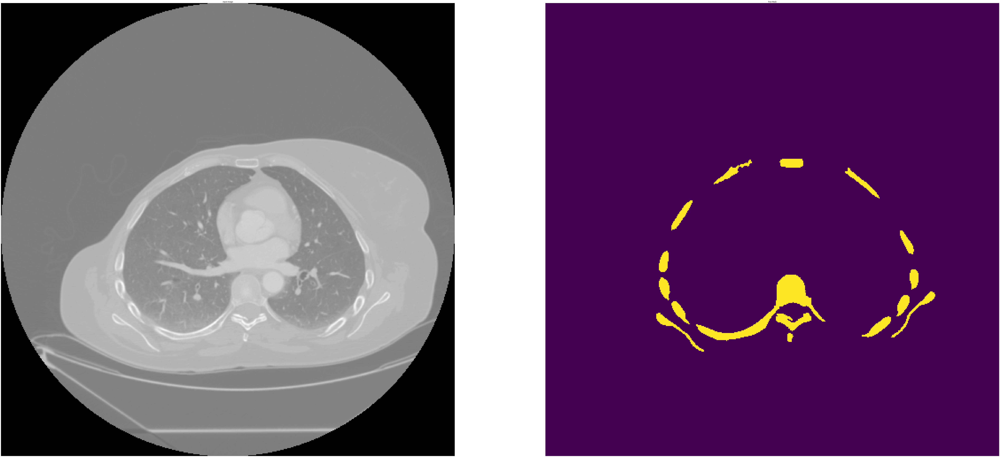

tf.Tensor([220 512 512   3], shape=(4,), dtype=int32)
tf.Tensor([220 512 512   1], shape=(4,), dtype=int32)


In [20]:
display([train_dataset_input_image[100],train_dataset_input_mask[100]])
plt.show()

print(tf.shape(train_dataset_input_image))
print(tf.shape(train_dataset_input_mask))

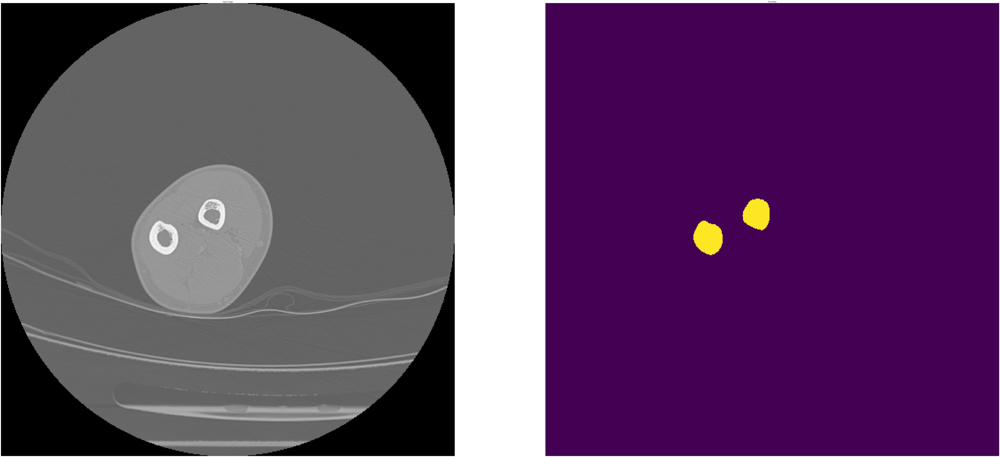

In [21]:
display([train_dataset_input_image[0], train_dataset_input_mask[0]])

In [22]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[512, 512, 3], include_top=False)

# 使用这些层的激活设置
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# 创建特征提取模型
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

In [23]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [24]:
def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[512, 512, 3])
    x = inputs

    # 在模型中降频取样
    skips = down_stack(x)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # 升频取样然后建立跳跃连接
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

    # 这是模型的最后一层
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [25]:
OUTPUT_CHANNELS=3

In [26]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [27]:
tf.keras.utils.plot_model(model, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [28]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [29]:
print(tf.shape(train_dataset_input_image))
print(tf.shape(train_dataset_input_mask))

tf.Tensor([220 512 512   3], shape=(4,), dtype=int32)
tf.Tensor([220 512 512   1], shape=(4,), dtype=int32)


In [30]:
def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
      
    else:
        display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])
        

1/1 [==============================] - 1s 1s/step


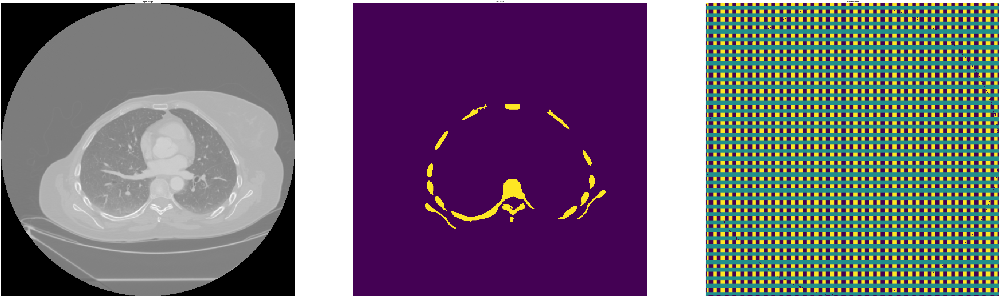

In [31]:
display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

In [32]:
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        show_predictions()
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

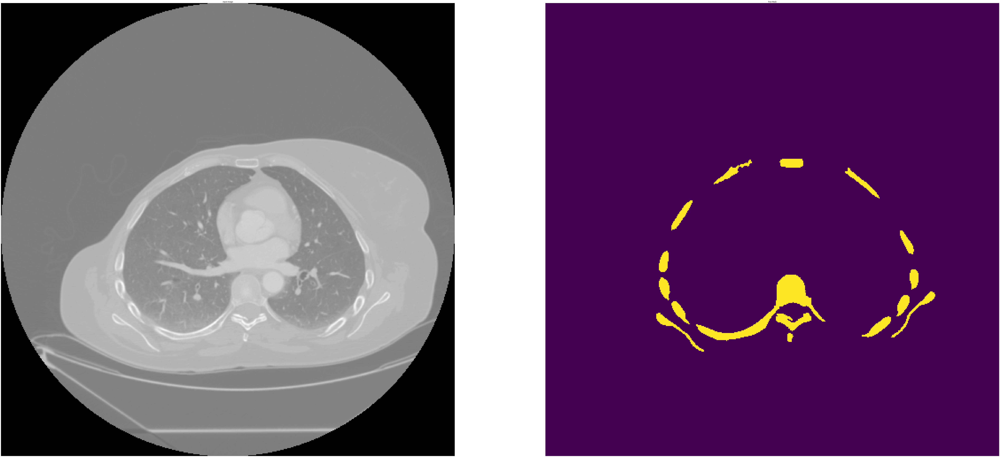

In [33]:
sample_image, sample_mask = train_dataset_input_image[100], train_dataset_input_mask[100]
display([sample_image, sample_mask])

In [34]:
print(sample_mask.shape)
# for i in range(len(sample_mask)):
#     for j in range(len(sample_mask[i])):
#         if(sample_mask[i][j]):
#             print(i,j,sample_mask[i][j])


(512, 512, 1)


In [35]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_dataset_input_image,train_dataset_input_mask))
test_dataset = tf.data.Dataset.from_tensor_slices((test_dataset_input_image,test_dataset_input_mask))

1/1 [==============================] - 0s 176ms/step


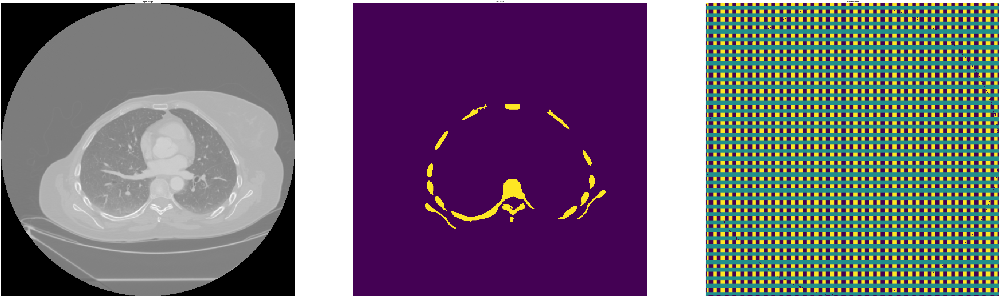

In [36]:
display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

In [37]:
train_dataset

<TensorSliceDataset element_spec=(TensorSpec(shape=(512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(512, 512, 1), dtype=tf.float32, name=None))>

In [38]:
TRAIN_LENGTH = len(train_dataset_input_image)
BATCH_SIZE = 5
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [39]:
train_dataset = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

1/1 [==============================] - 0s 174ms/step


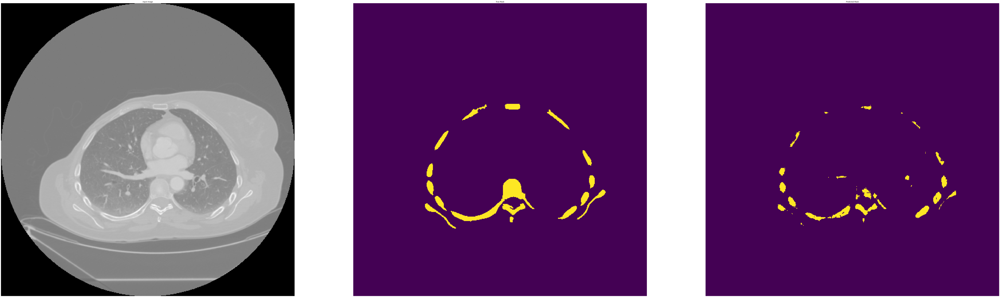


Sample Prediction after epoch 20

44/44 [==============================] - 69s 2s/step - loss: 0.0191 - accuracy: 0.9927


In [40]:
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(test_dataset_input_image)//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          #validation_steps=VALIDATION_STEPS,
                          #validation_data=test_dataset,
                          callbacks=[DisplayCallback()])

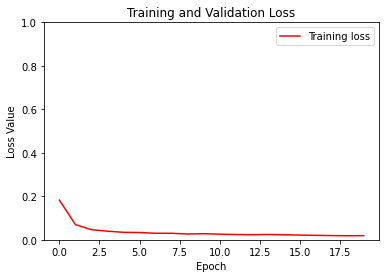

In [41]:
loss = model_history.history['loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

In [42]:
print(test_dataset)

<TensorSliceDataset element_spec=(TensorSpec(shape=(512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(512, 512, 1), dtype=tf.float32, name=None))>


In [76]:
def show_predictions(dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            print(image.shape)
            pred_mask = model.predict(image)
            ()
            display([image[0], mask[0], create_mask(pred_mask)])
      
    else:
        print(sample_image[tf.newaxis, ...].shape)
        display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

In [134]:
train_dataset_input_image,train_dataset_input_mask = load_image_train(im_train_slice,im_train_bone)
test_dataset_input_image,test_dataset_input_mask = load_image_test(im_test_slice,im_test_bone)
train_dataset = tf.data.Dataset.from_tensor_slices((train_dataset_input_image,train_dataset_input_mask))
test_dataset = tf.data.Dataset.from_tensor_slices((test_dataset_input_image,test_dataset_input_mask))
test_dataset = test_dataset.batch(1)

(1, 512, 512, 3)
1/1 [==============================] - 0s 422ms/step


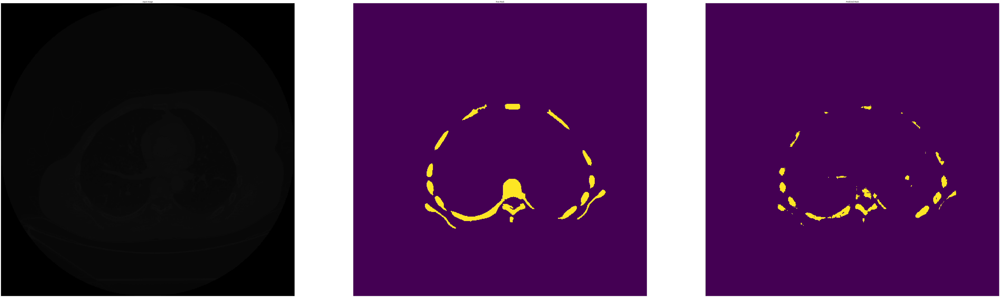

In [135]:
show_predictions()

(1, 512, 512, 3)
1/1 [==============================] - 0s 187ms/step


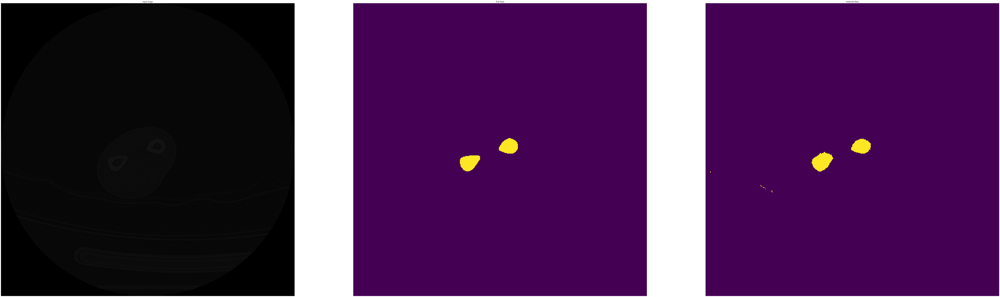

(1, 512, 512, 3)
1/1 [==============================] - 0s 178ms/step


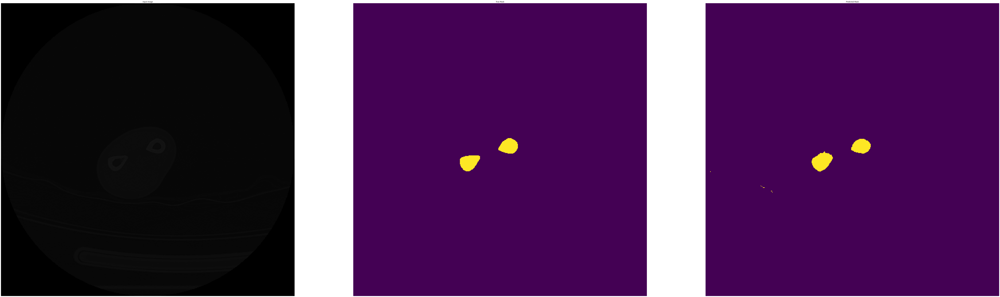

(1, 512, 512, 3)
1/1 [==============================] - 0s 170ms/step


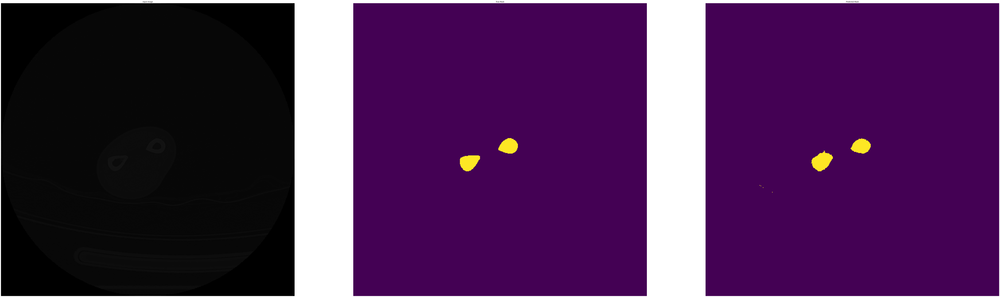

In [136]:
show_predictions(test_dataset, 3)

(1, 512, 512, 3)
1/1 [==============================] - 0s 166ms/step


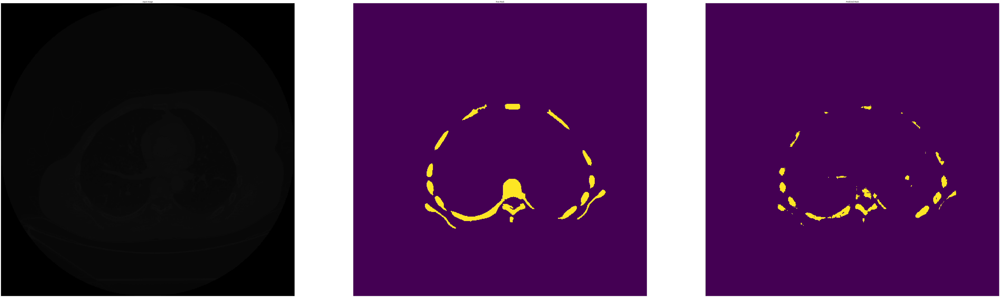

In [137]:
show_predictions()

In [138]:
print(test_dataset)

<BatchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.float32, name=None))>


In [139]:
print(sample_image.shape)

(512, 512, 3)


(1, 512, 512, 3)
1/1 [==============================] - 0s 198ms/step


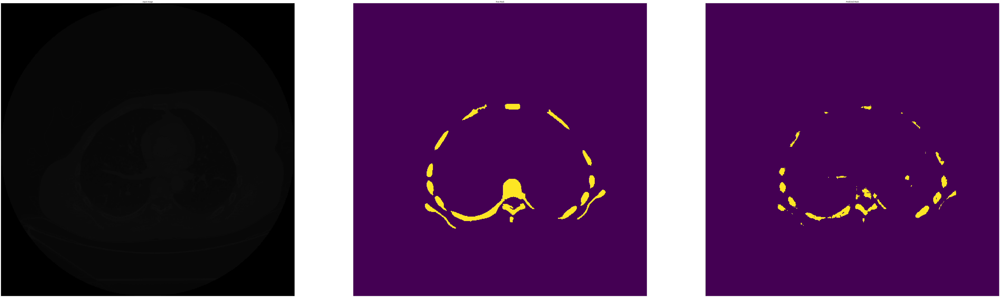

In [140]:
show_predictions()

In [141]:
# for element in train_dataset.as_numpy_iterator():
#     image,mask = element
#     print(image.shape)

In [142]:
# for element in test_dataset.as_numpy_iterator():
#     image,mask = element
#     print(image.shape)

1/1 [==============================] - 0s 179ms/step


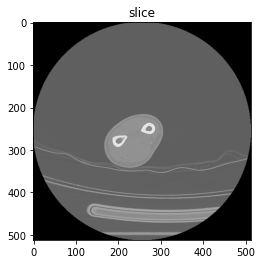

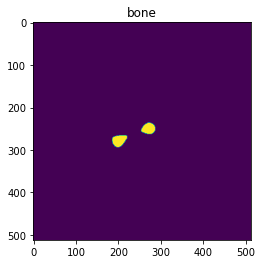

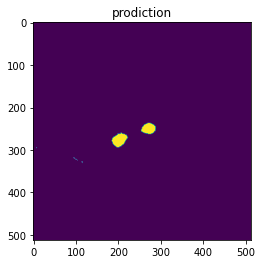

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_0(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_0.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_0(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[166.] 262144
1/1 [==============================] - 0s 173ms/step


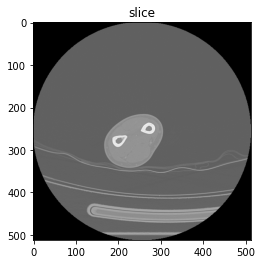

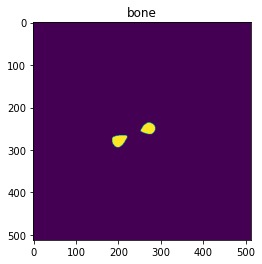

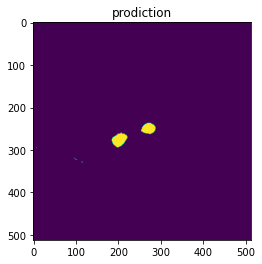

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_1(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_1.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_1(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[336.] 524288
1/1 [==============================] - 0s 190ms/step


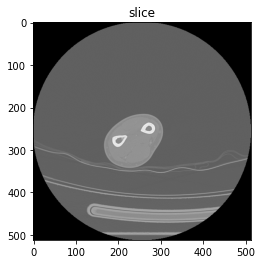

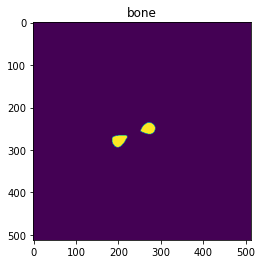

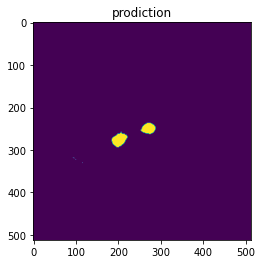

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_2(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_2.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_2(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[510.] 786432
1/1 [==============================] - 0s 172ms/step


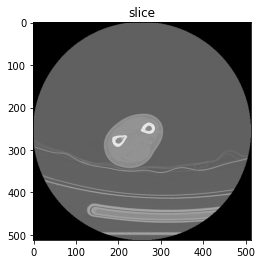

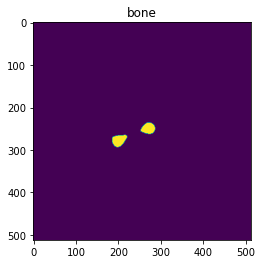

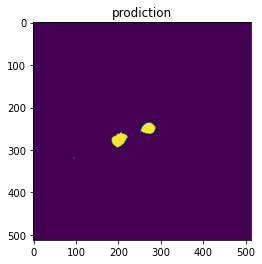

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_3(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_3.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_3(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[670.] 1048576
1/1 [==============================] - 0s 186ms/step


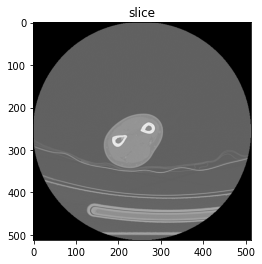

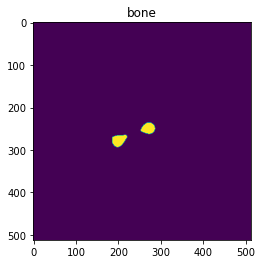

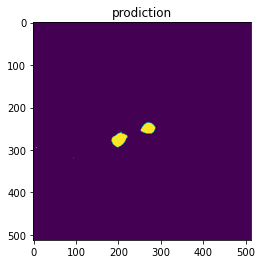

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_4(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_4.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_4(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[828.] 1310720
1/1 [==============================] - 0s 214ms/step


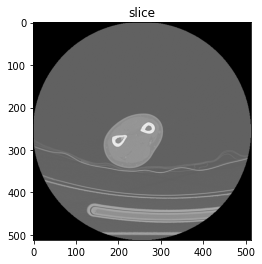

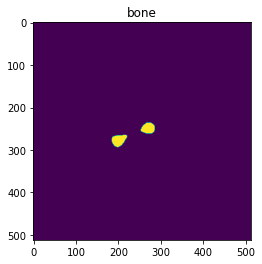

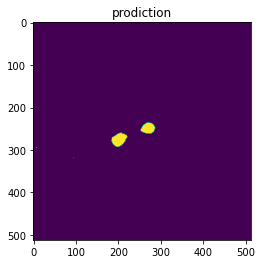

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_5(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_5.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_5(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[970.] 1572864
1/1 [==============================] - 0s 195ms/step


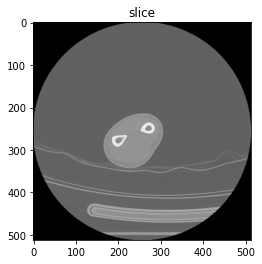

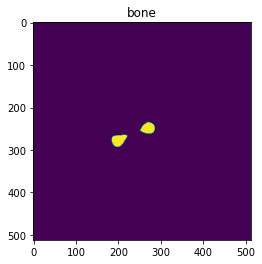

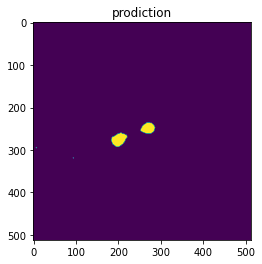

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_6(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_6.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_6(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[1115.] 1835008
1/1 [==============================] - 0s 212ms/step


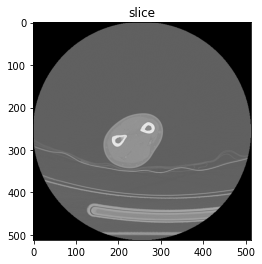

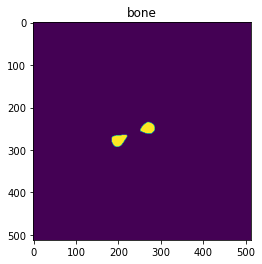

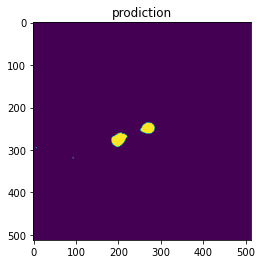

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_7(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_7.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_7(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[1273.] 2097152
1/1 [==============================] - 0s 222ms/step


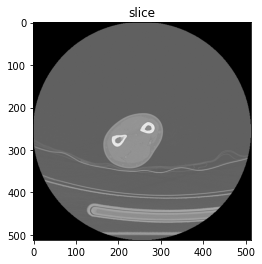

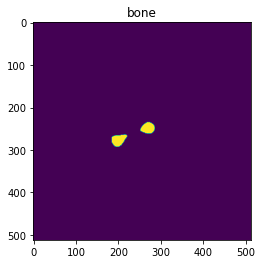

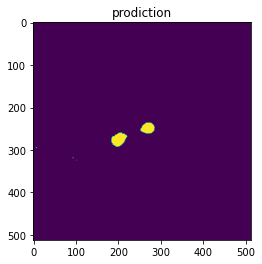

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_8(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_8.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_8(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[1440.] 2359296
1/1 [==============================] - 0s 195ms/step


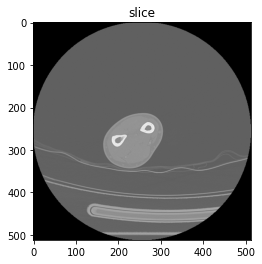

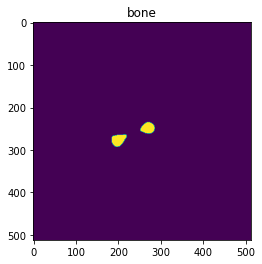

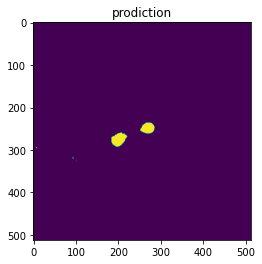

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_9(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_9.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_9(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[1608.] 2621440
1/1 [==============================] - 0s 178ms/step


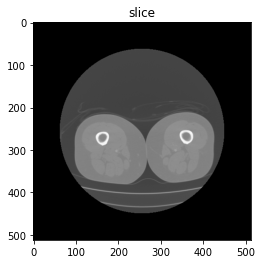

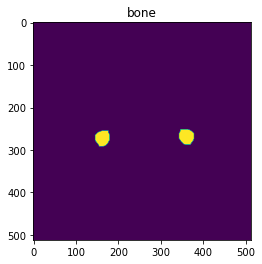

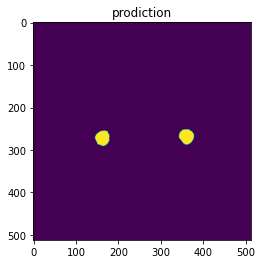

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_10(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_10.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_10(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[1779.] 2883584
1/1 [==============================] - 0s 175ms/step


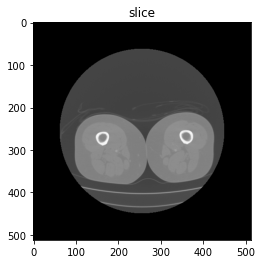

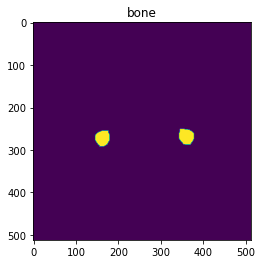

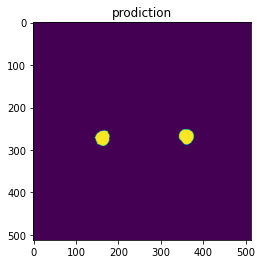

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_11(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_11.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_11(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[1965.] 3145728
1/1 [==============================] - 0s 185ms/step


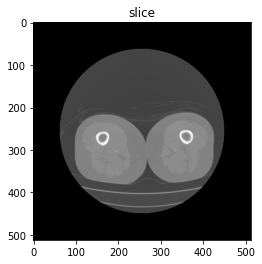

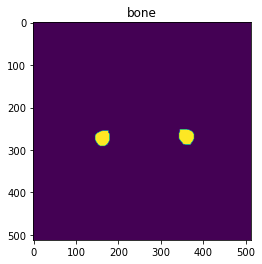

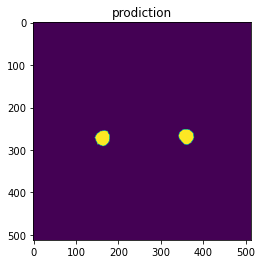

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_12(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_12.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_12(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[2129.] 3407872
1/1 [==============================] - 0s 173ms/step


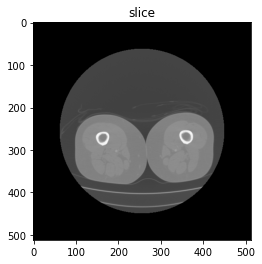

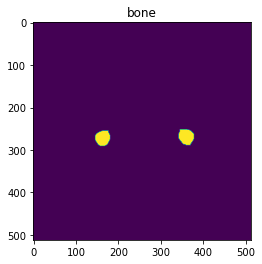

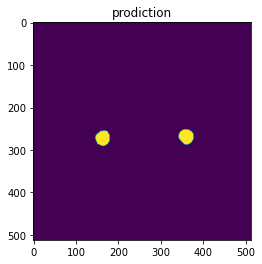

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_13(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_13.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_13(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[2318.] 3670016
1/1 [==============================] - 0s 183ms/step


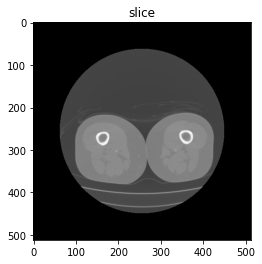

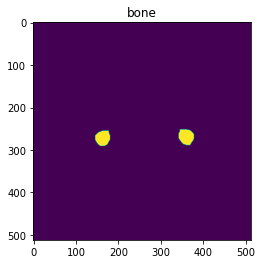

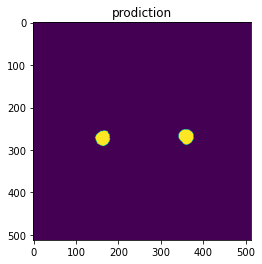

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_14(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_14.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_14(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[2505.] 3932160
1/1 [==============================] - 0s 173ms/step


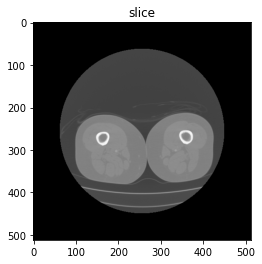

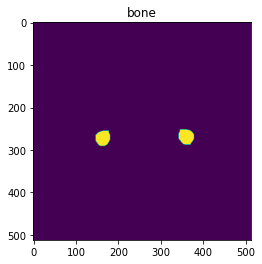

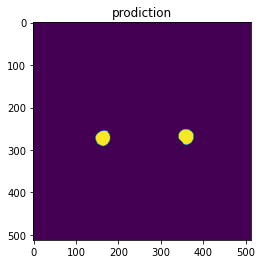

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_15(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_15.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_15(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[2664.] 4194304
1/1 [==============================] - 0s 177ms/step


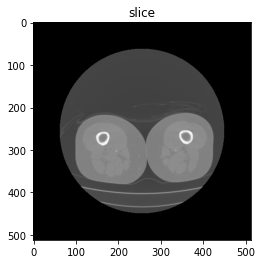

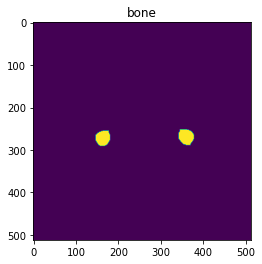

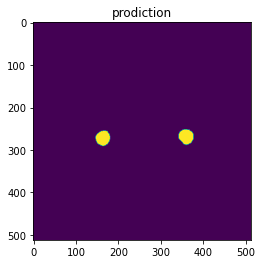

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_16(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_16.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_16(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[2828.] 4456448
1/1 [==============================] - 0s 188ms/step


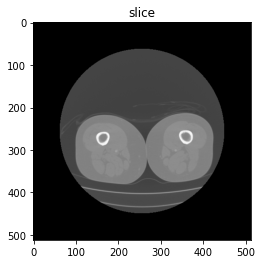

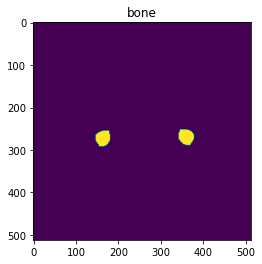

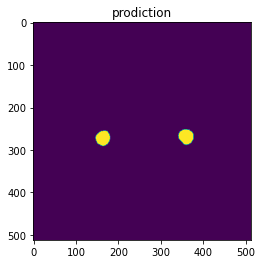

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_17(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_17.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_17(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[3015.] 4718592
1/1 [==============================] - 0s 175ms/step


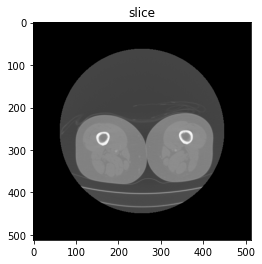

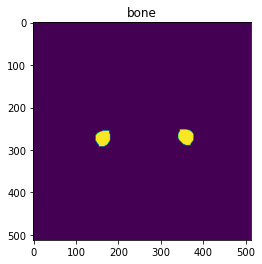

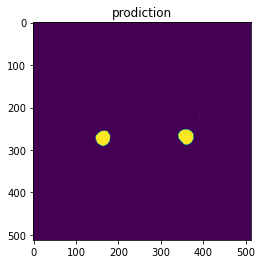

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_18(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_18.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_18(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[3205.] 4980736
1/1 [==============================] - 0s 260ms/step


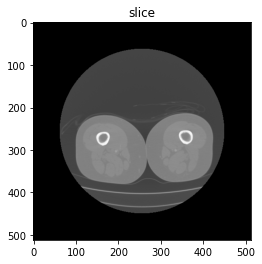

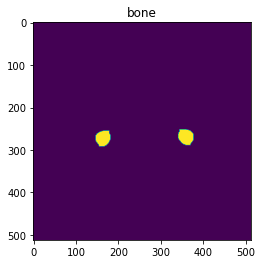

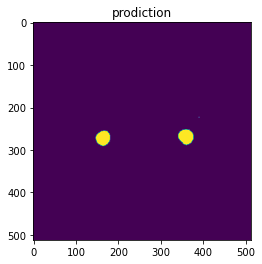

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_19(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:28: UserWarning: result/test/bone/mask_19.jpg is a low contrast image
  skimage.io.imsave(path,mask[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_19(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[3409.] 5242880
1/1 [==============================] - 0s 186ms/step


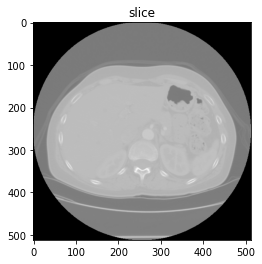

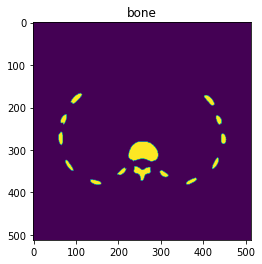

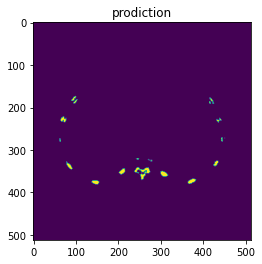

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_20(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_20(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[7745.] 5505024
1/1 [==============================] - 0s 209ms/step


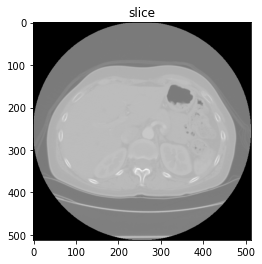

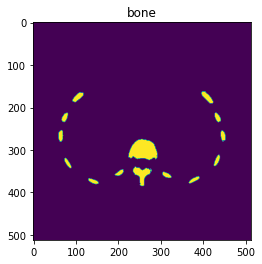

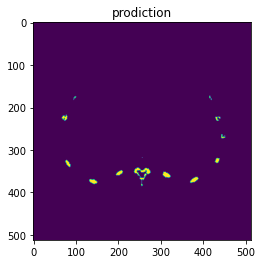

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_21(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_21(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[12376.] 5767168
1/1 [==============================] - 0s 237ms/step


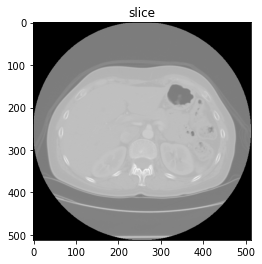

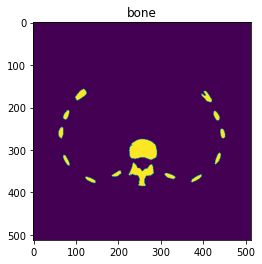

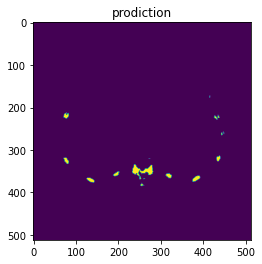

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_22(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_22(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[17453.] 6029312
1/1 [==============================] - 0s 182ms/step


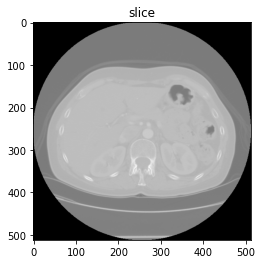

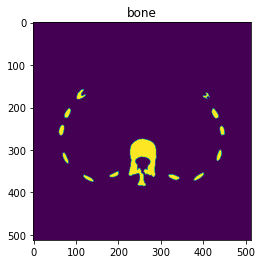

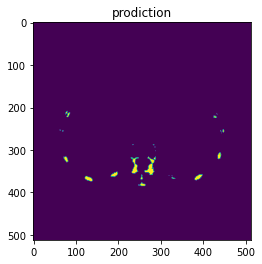

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_23(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_23(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[22329.] 6291456
1/1 [==============================] - 0s 189ms/step


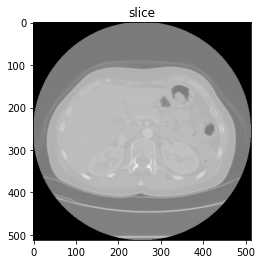

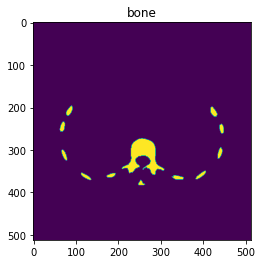

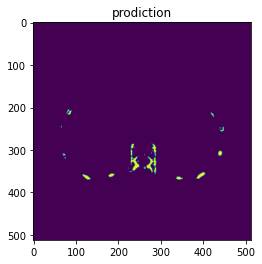

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_24(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_24(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[26568.] 6553600
1/1 [==============================] - 0s 217ms/step


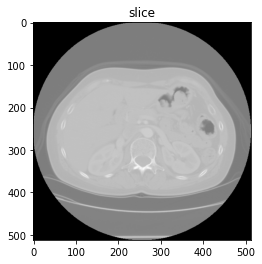

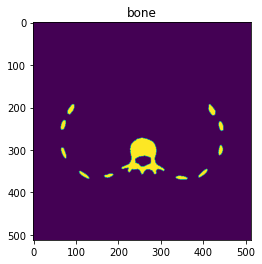

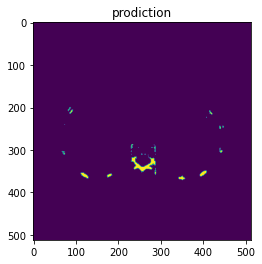

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_25(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_25(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[31104.] 6815744
1/1 [==============================] - 0s 183ms/step


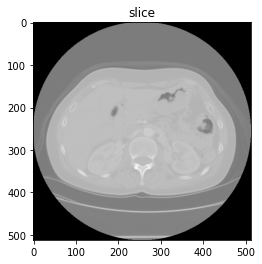

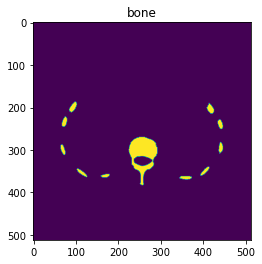

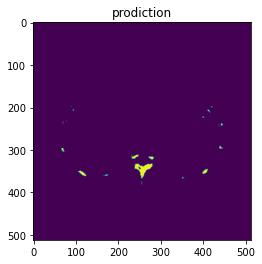

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_26(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_26(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[35674.] 7077888
1/1 [==============================] - 0s 186ms/step


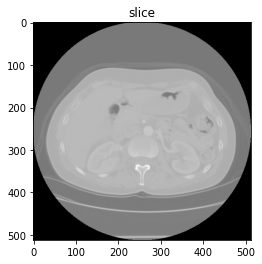

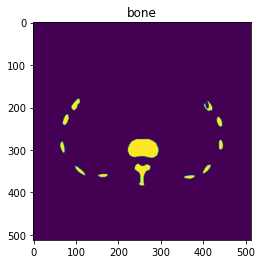

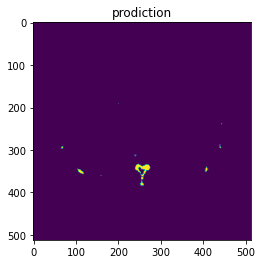

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_27(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_27(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[40299.] 7340032
1/1 [==============================] - 0s 182ms/step


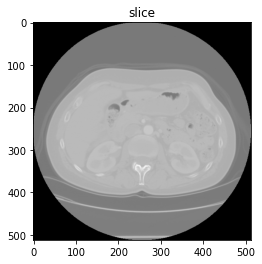

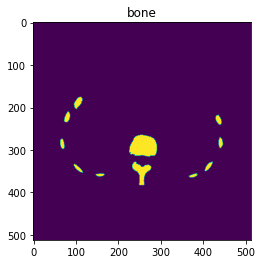

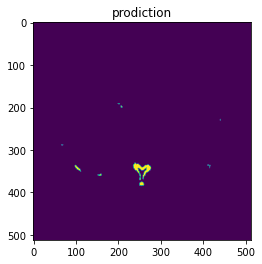

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_28(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_28(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[45008.] 7602176
1/1 [==============================] - 0s 199ms/step


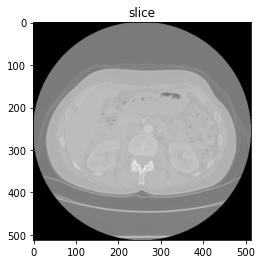

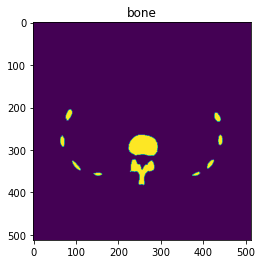

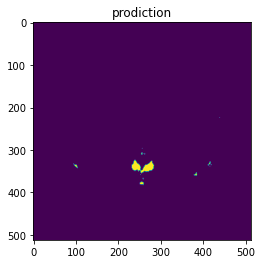

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_29(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_29(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[49694.] 7864320
1/1 [==============================] - 0s 201ms/step


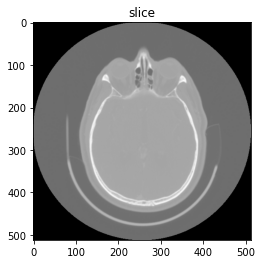

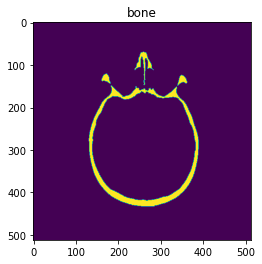

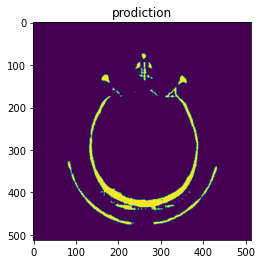

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_30(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_30(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[55838.] 8126464
1/1 [==============================] - 0s 185ms/step


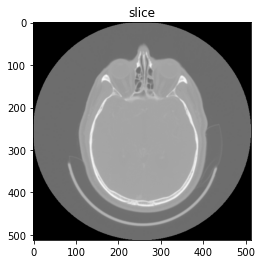

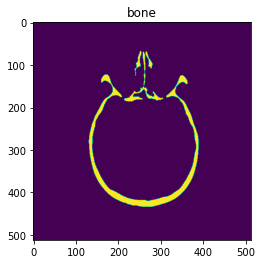

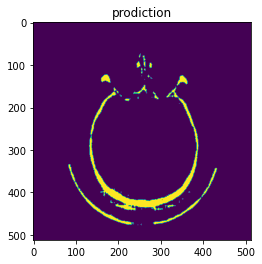

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_31(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_31(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[61457.] 8388608
1/1 [==============================] - 0s 178ms/step


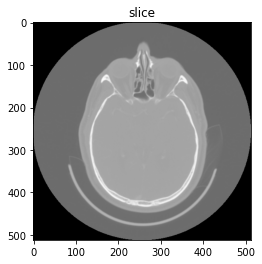

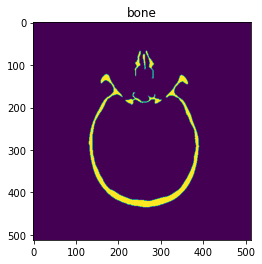

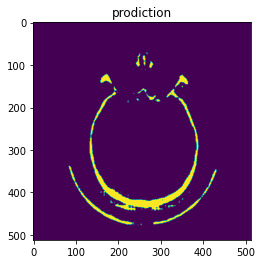

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_32(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_32(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[66660.] 8650752
1/1 [==============================] - 0s 179ms/step


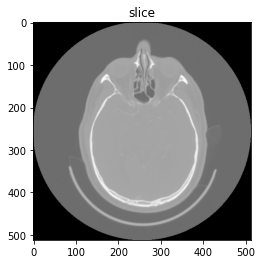

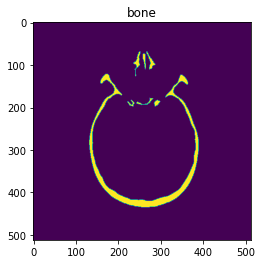

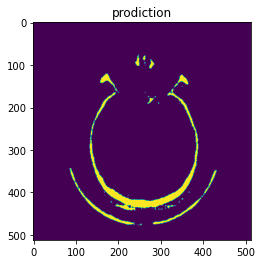

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_33(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_33(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[71350.] 8912896
1/1 [==============================] - 0s 191ms/step


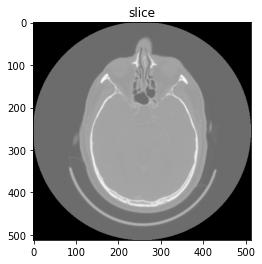

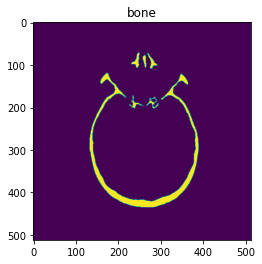

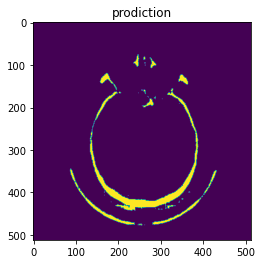

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_34(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_34(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[76312.] 9175040
1/1 [==============================] - 0s 193ms/step


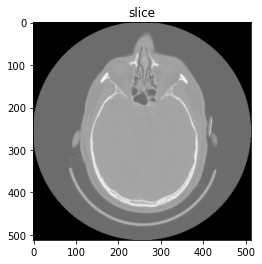

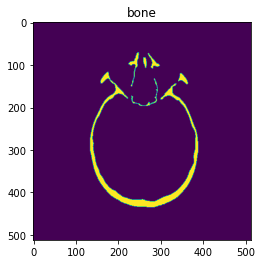

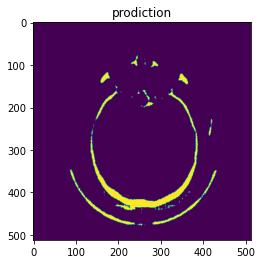

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_35(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_35(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[81843.] 9437184
1/1 [==============================] - 0s 218ms/step


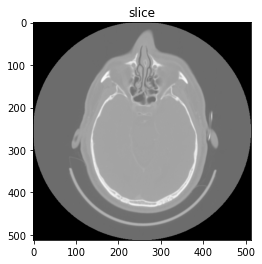

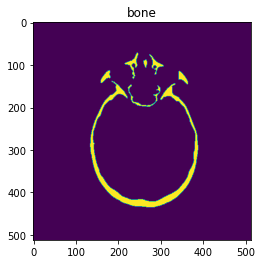

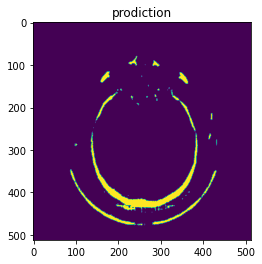

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_36(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_36(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[88232.] 9699328
1/1 [==============================] - 0s 177ms/step


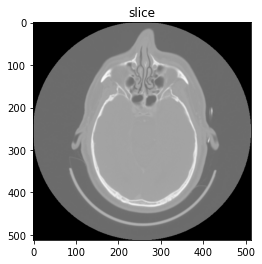

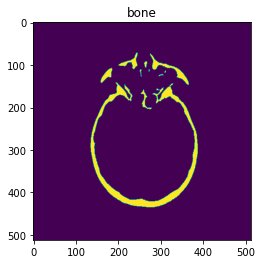

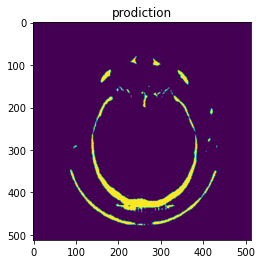

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_37(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_37(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[95705.] 9961472
1/1 [==============================] - 0s 204ms/step


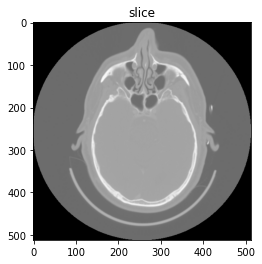

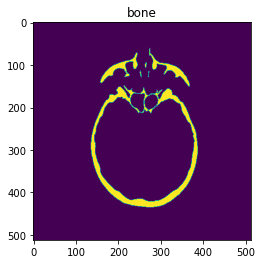

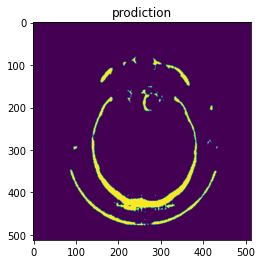

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_38(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_38(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[104447.] 10223616
1/1 [==============================] - 0s 184ms/step


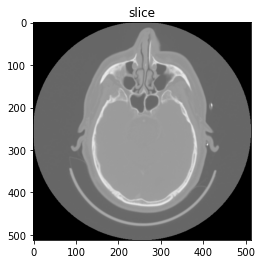

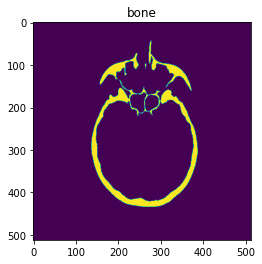

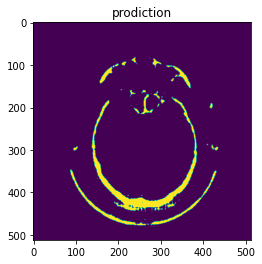

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_39(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_39(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[114017.] 10485760
1/1 [==============================] - 0s 199ms/step


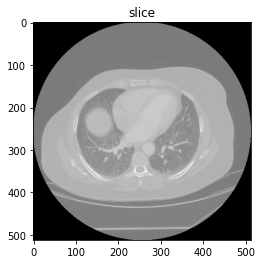

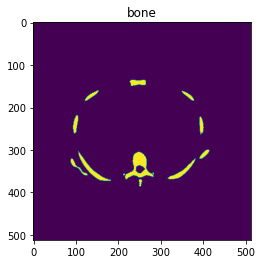

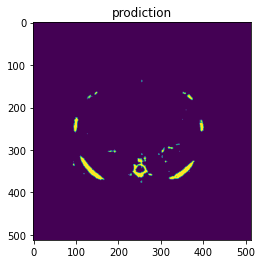

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_40(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_40(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[117131.] 10747904
1/1 [==============================] - 0s 175ms/step


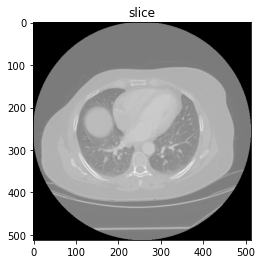

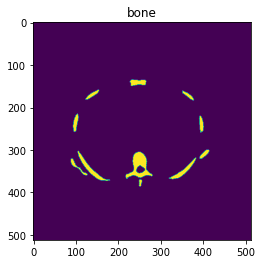

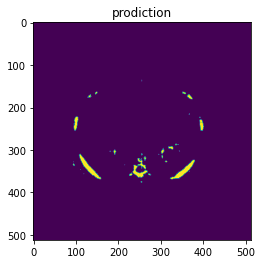

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_41(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_41(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[120273.] 11010048
1/1 [==============================] - 0s 182ms/step


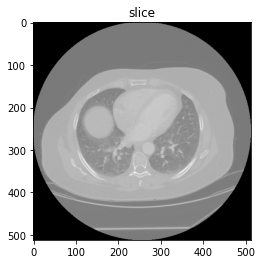

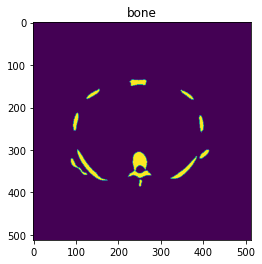

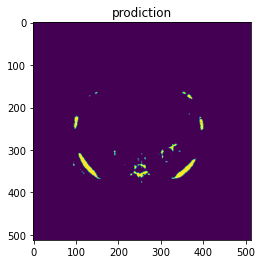

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_42(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_42(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[123500.] 11272192
1/1 [==============================] - 0s 187ms/step


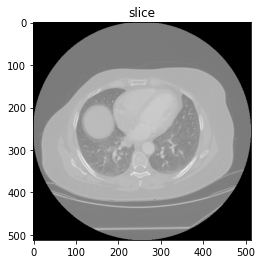

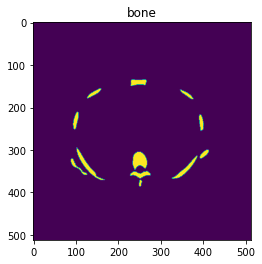

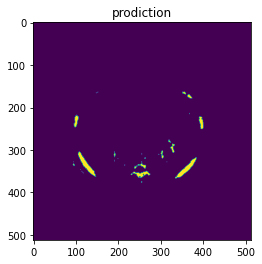

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_43(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_43(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[126689.] 11534336
1/1 [==============================] - 0s 173ms/step


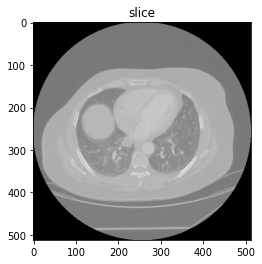

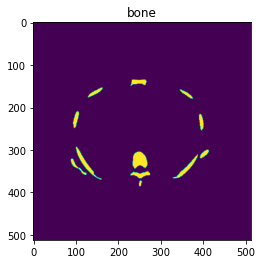

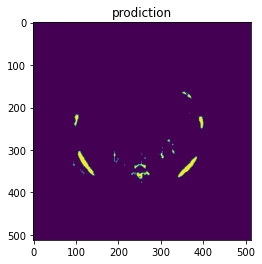

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_44(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_44(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[129788.] 11796480
1/1 [==============================] - 0s 181ms/step


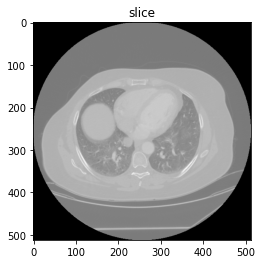

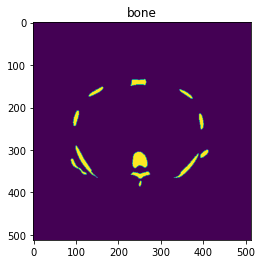

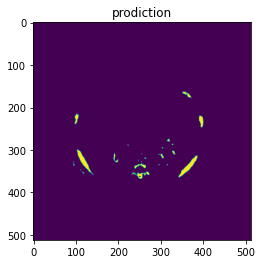

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_45(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_45(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[132935.] 12058624
1/1 [==============================] - 0s 184ms/step


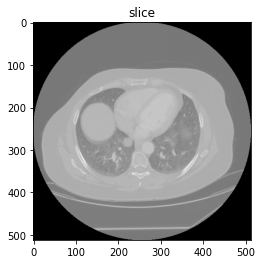

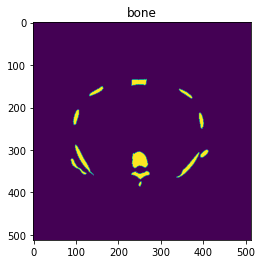

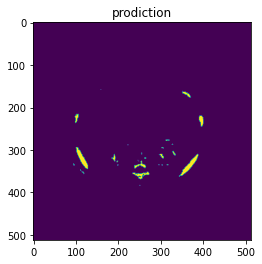

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_46(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_46(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[136048.] 12320768
1/1 [==============================] - 0s 246ms/step


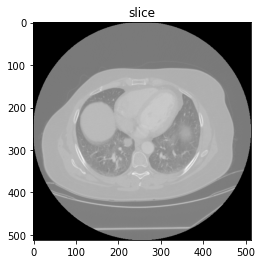

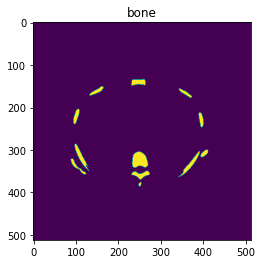

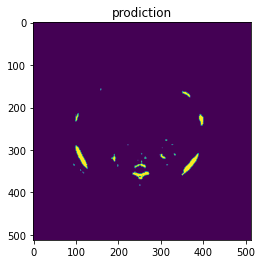

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_47(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_47(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[139006.] 12582912
1/1 [==============================] - 0s 196ms/step


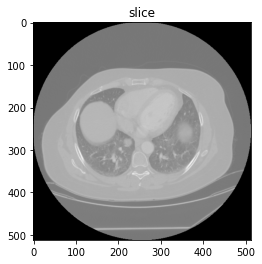

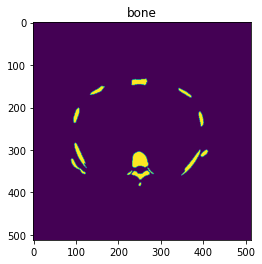

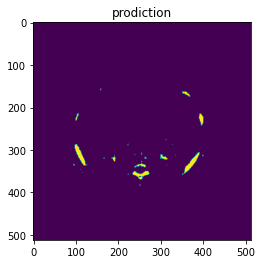

(1, 512, 512, 1) (512, 512, 1)
[142060.] 12845056


C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_48(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_48(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


1/1 [==============================] - 0s 195ms/step


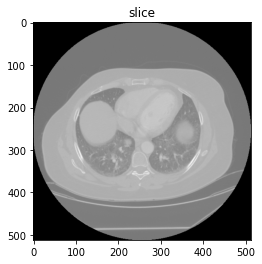

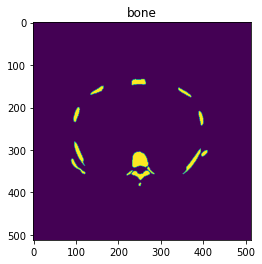

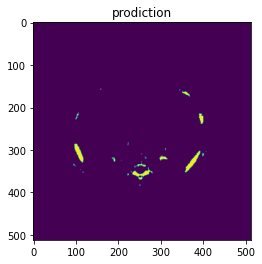

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:26: UserWarning: result/test/bone/mask_49(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/458020703.py:30: UserWarning: result/test/bone/mask_49(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from int64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
[145101.] 13107200


In [182]:
#bone+IOU:
count=0
count_all=0;
o=0;
for element in test_dataset.as_numpy_iterator():
    image,mask =element
    pred_mask = model.predict(image)
    plt.title("slice")
    plt.imshow(tf.keras.preprocessing.image.array_to_img(image[0]))
    plt.show()
    plt.title("bone")
    plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[0]))
    plt.show()
    plt.title("prodiction")
    plt.imshow(create_mask(pred_mask))
    plt.show()
    count_all+=512*512
    pred_mask= create_mask(pred_mask).numpy()
    print(mask.shape,pred_mask.shape)

    count+=sum(sum(abs(mask[0]-pred_mask)))
            
    print(count,count_all)
    
    path="result/test/bone/mask_" + str(o) +"(original).tif"
    skimage.io.imsave(path,image[0])
    path="result/test/bone/mask_" + str(o) +".jpg"
    skimage.io.imsave(path,mask[0])
    path="result/test/bone/mask_" + str(o) +"(pred).jpg"
    skimage.io.imsave(path,pred_mask)
    o+=1

In [195]:
print('IOU:',count,count_all,1-(count/count_all))
print("IOU: %.2f%%" % ((1-(count/count_all))*100))

IOU: [145101.] 13107200 [0.98892967]
IOU: 98.89%


In [198]:

train_dataset_input_image,train_dataset_input_mask = load_image_train(im_train_slice,im_train_overlay)
test_dataset_input_image,test_dataset_input_mask = load_image_test(im_test_slice,im_test_overlay)
train_dataset = tf.data.Dataset.from_tensor_slices((train_dataset_input_image,train_dataset_input_mask))
test_dataset = tf.data.Dataset.from_tensor_slices((test_dataset_input_image,test_dataset_input_mask))
test_dataset = test_dataset.batch(1)

In [211]:
im_test_slice_backup    = skio.imread('data/test/*/slice/*.tif')
im_test_slice_backup = skimage.transform.resize(im_test_slice_backup,(len(im_test_slice_backup),512,512,1) )

1/1 [==============================] - 0s 188ms/step


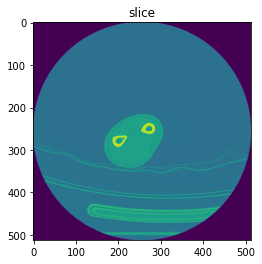

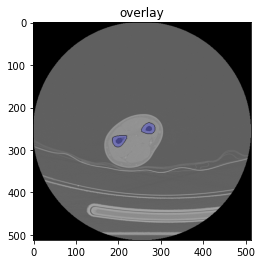

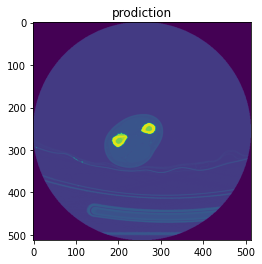

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_0(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_0(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 211ms/step


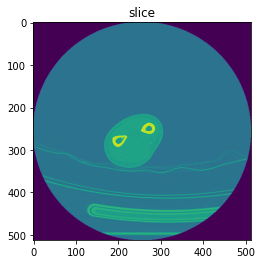

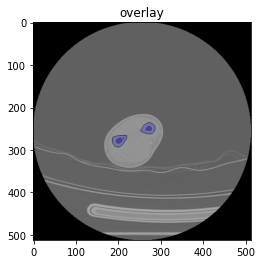

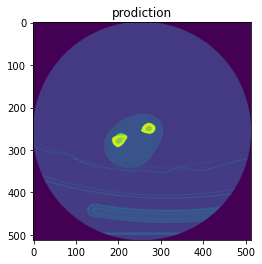

(1, 512, 512, 1) (512, 512, 1)


C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_1(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_1(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


1/1 [==============================] - 0s 226ms/step


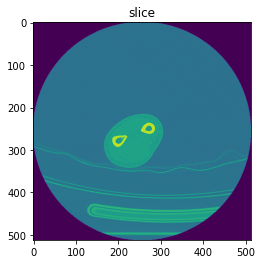

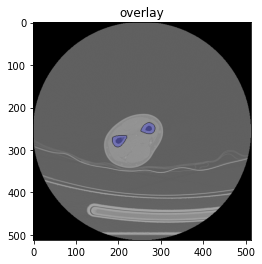

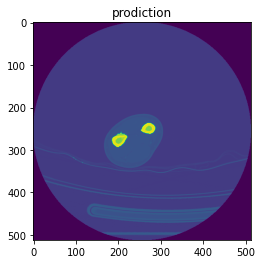

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_2(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_2(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 174ms/step


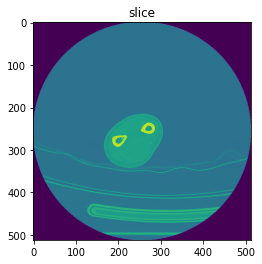

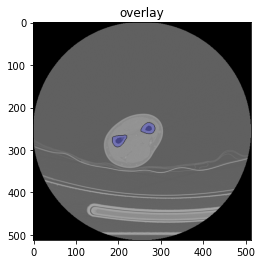

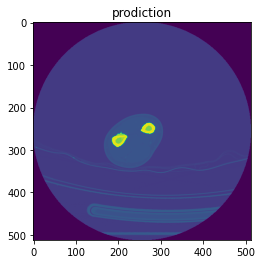

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_3(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_3(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 207ms/step


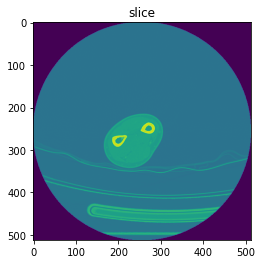

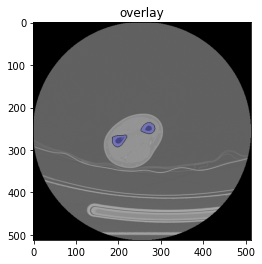

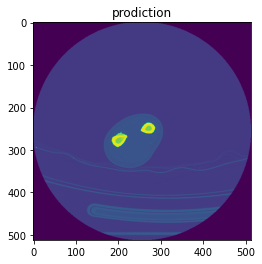

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_4(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_4(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 198ms/step


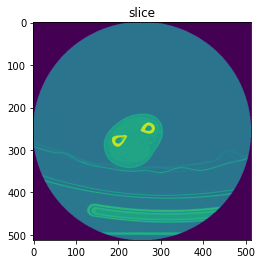

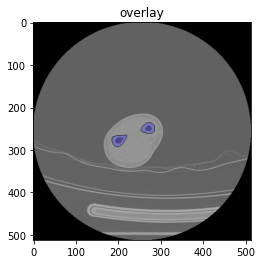

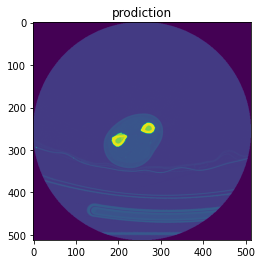

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_5(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_5(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 189ms/step


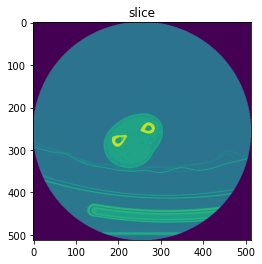

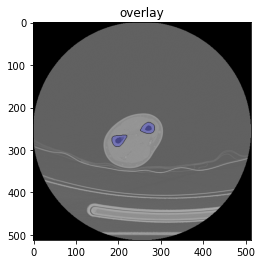

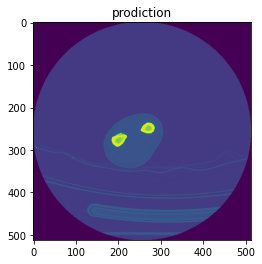

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_6(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_6(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 180ms/step


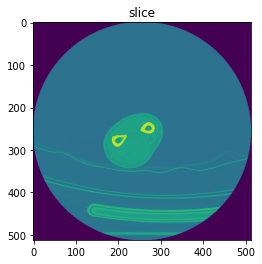

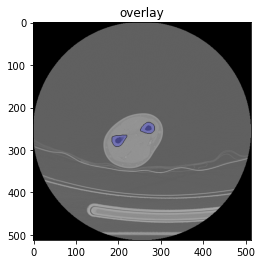

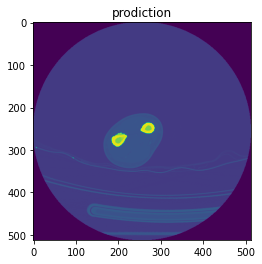

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_7(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_7(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 187ms/step


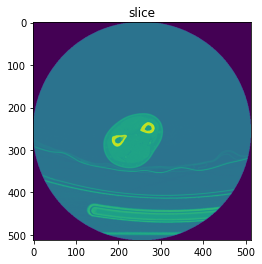

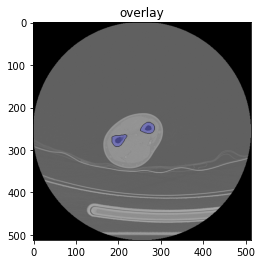

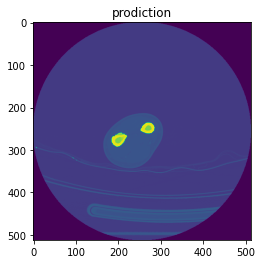

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_8(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_8(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 222ms/step


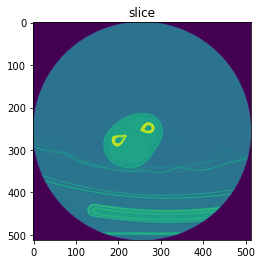

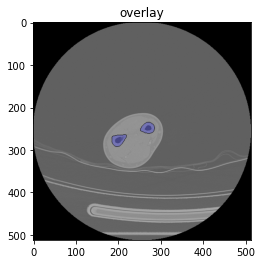

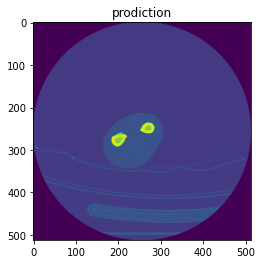

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_9(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_9(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 177ms/step


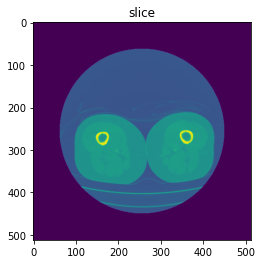

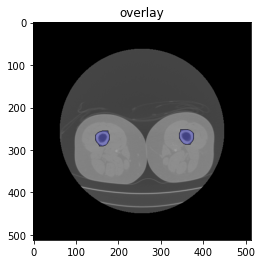

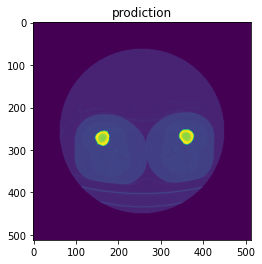

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_10(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_10(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 194ms/step


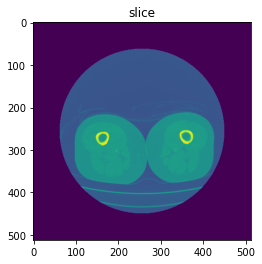

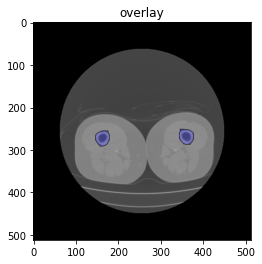

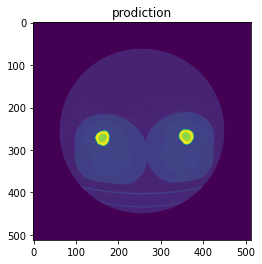

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_11(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_11(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 184ms/step


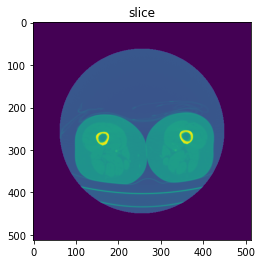

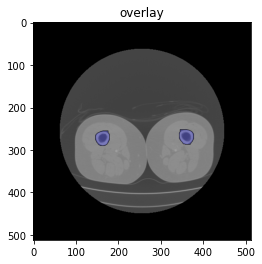

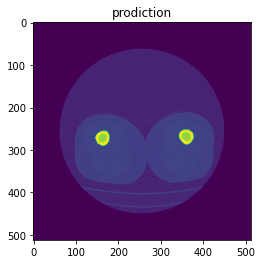

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_12(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_12(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 177ms/step


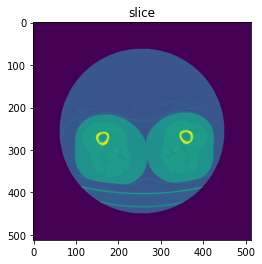

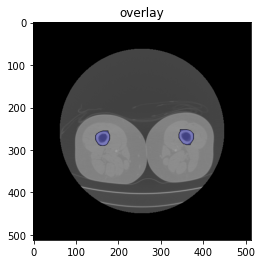

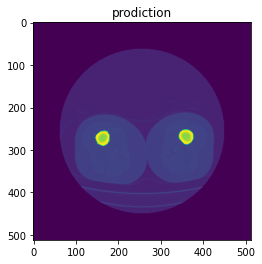

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_13(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_13(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 208ms/step


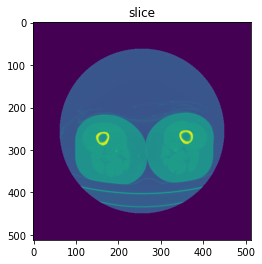

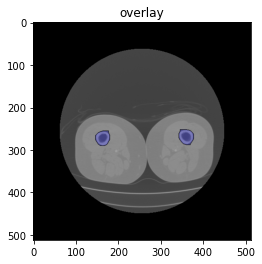

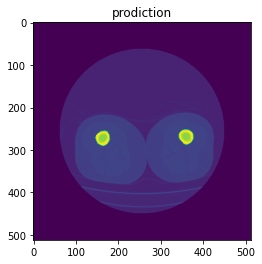

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_14(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_14(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 239ms/step


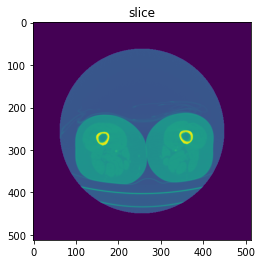

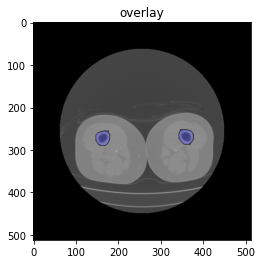

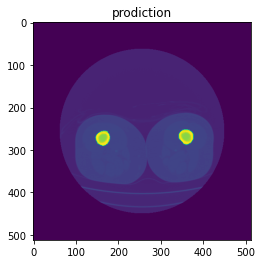

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_15(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_15(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 244ms/step


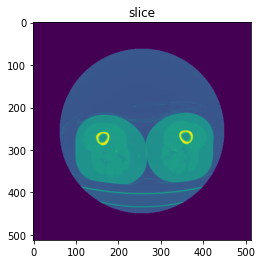

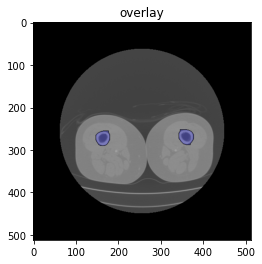

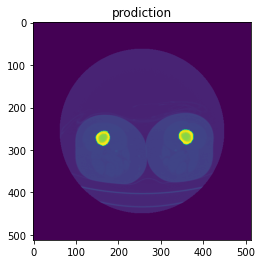

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_16(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_16(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 1s 545ms/step


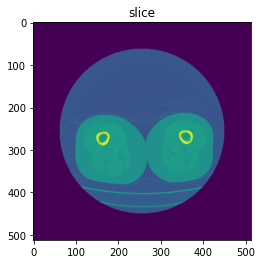

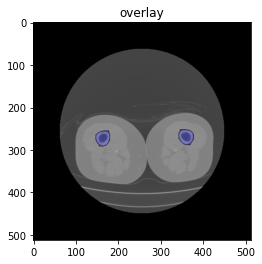

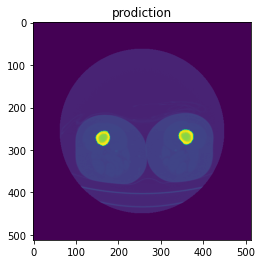

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_17(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_17(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 235ms/step


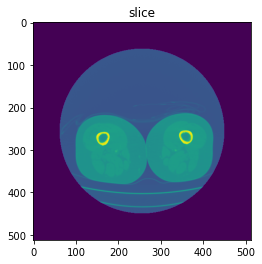

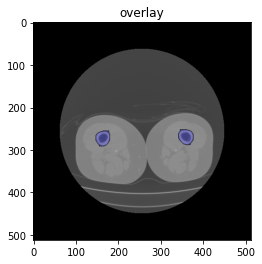

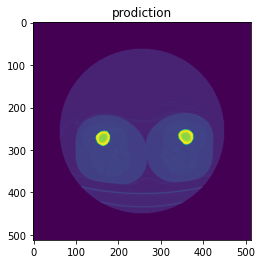

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_18(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_18(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 248ms/step


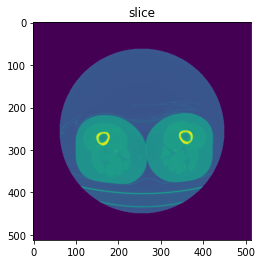

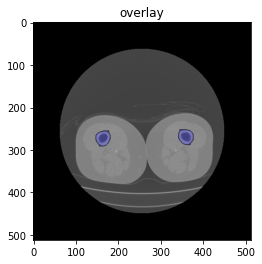

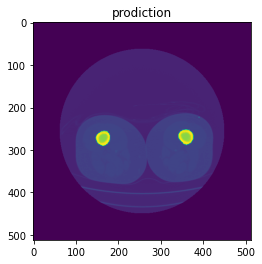

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_19(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_19(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 204ms/step


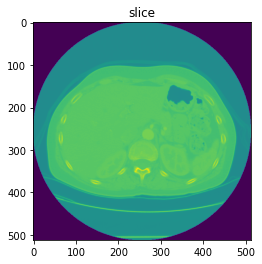

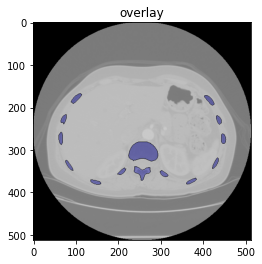

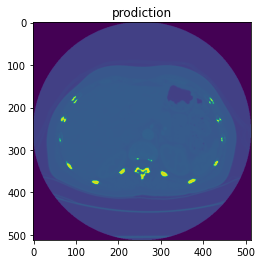

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_20(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_20(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 169ms/step


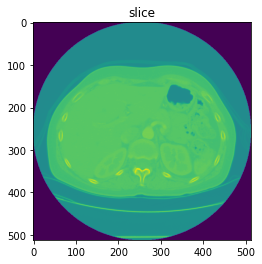

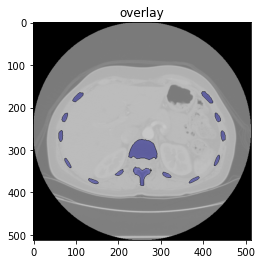

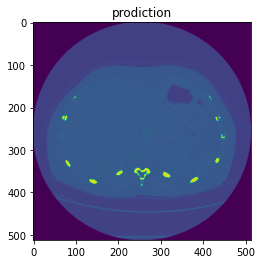

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_21(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_21(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 179ms/step


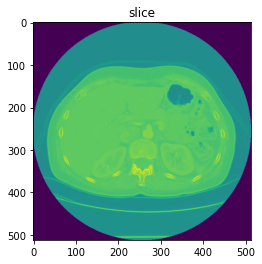

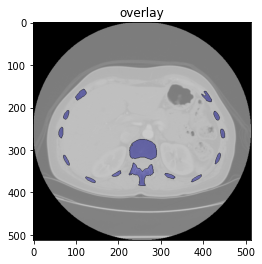

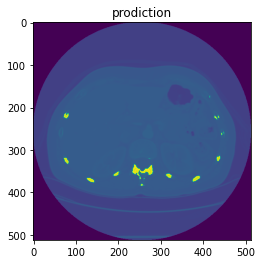

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_22(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_22(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 196ms/step


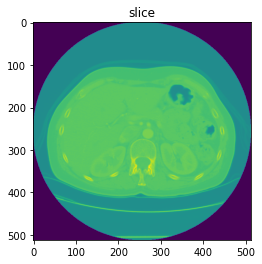

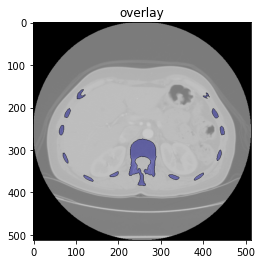

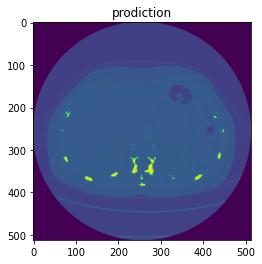

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_23(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_23(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 212ms/step


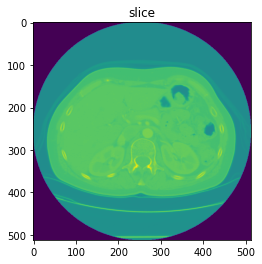

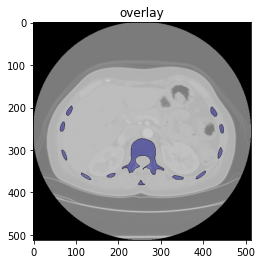

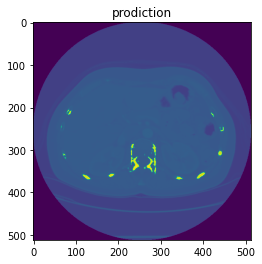

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_24(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_24(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 218ms/step


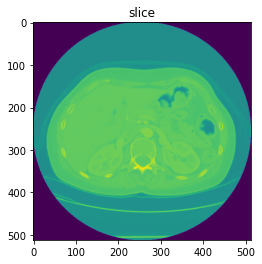

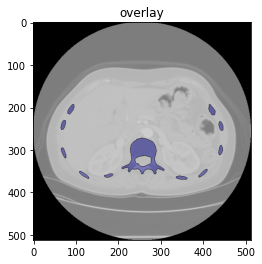

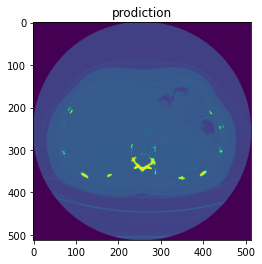

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_25(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_25(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 220ms/step


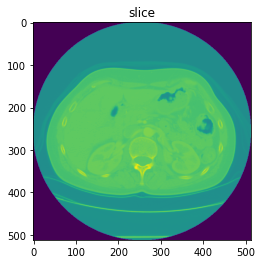

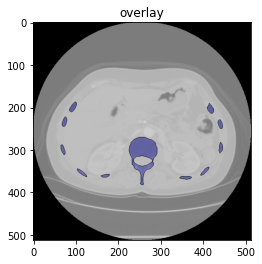

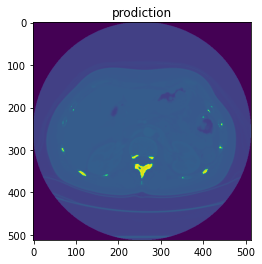

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_26(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_26(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 240ms/step


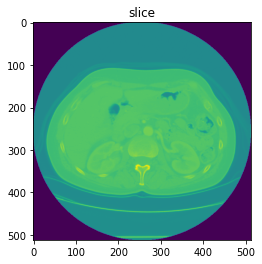

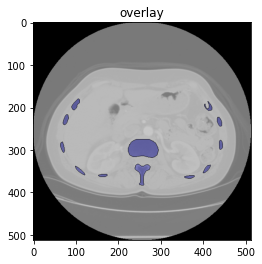

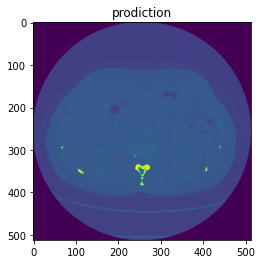

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_27(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_27(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 202ms/step


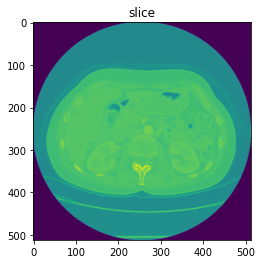

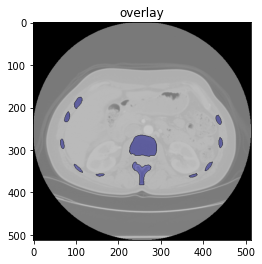

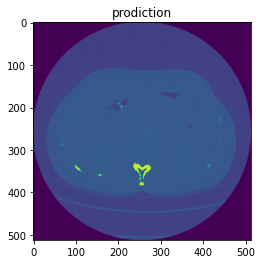

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_28(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_28(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 183ms/step


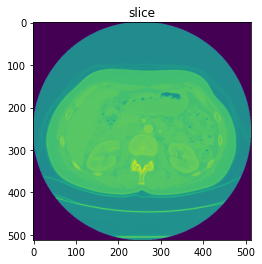

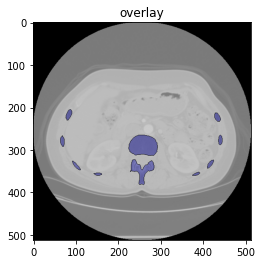

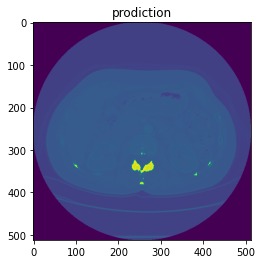

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_29(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_29(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 192ms/step


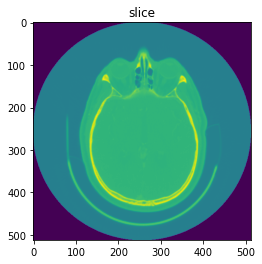

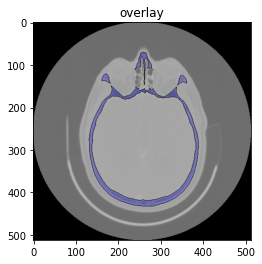

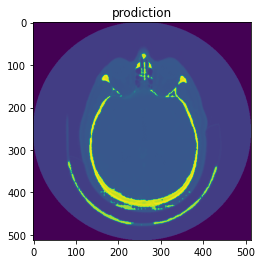

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_30(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 181ms/step


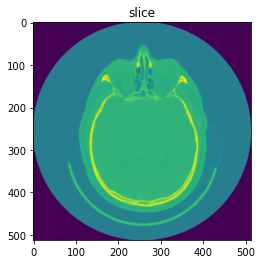

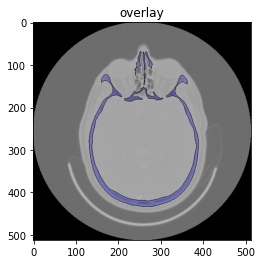

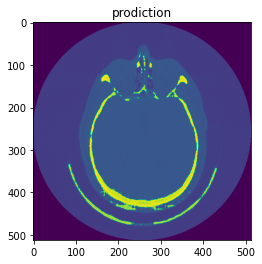

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_31(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 172ms/step


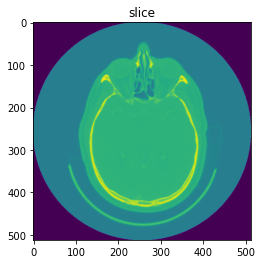

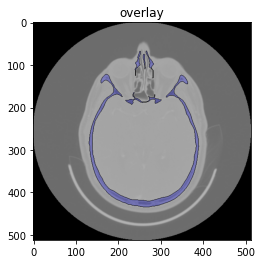

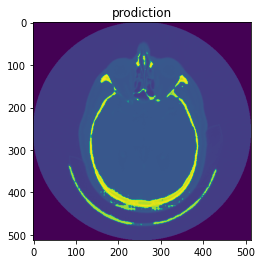

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_32(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 174ms/step


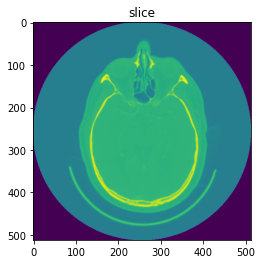

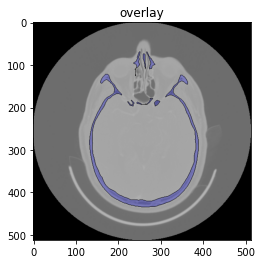

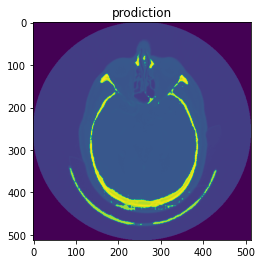

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_33(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 180ms/step


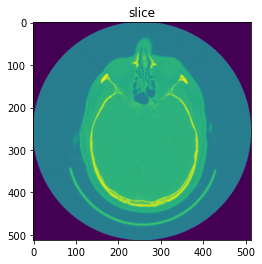

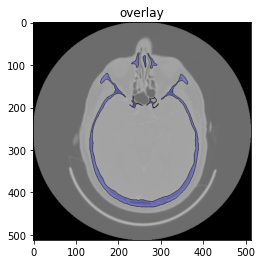

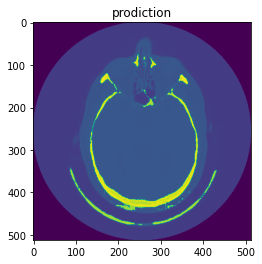

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_34(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 194ms/step


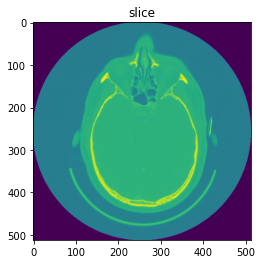

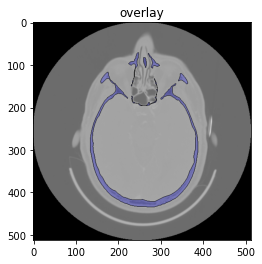

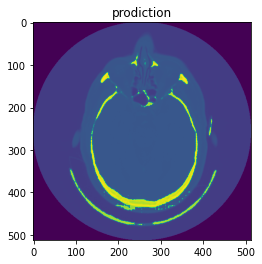

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_35(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 185ms/step


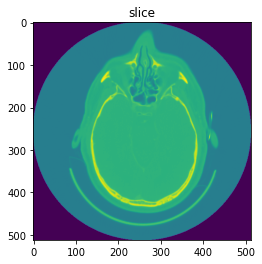

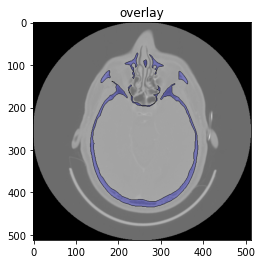

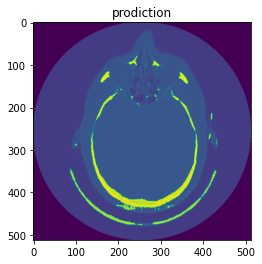

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_36(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 171ms/step


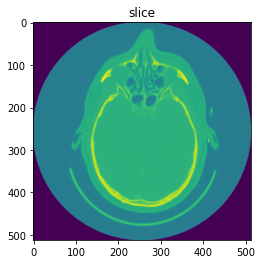

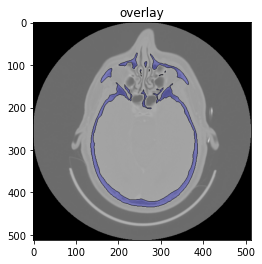

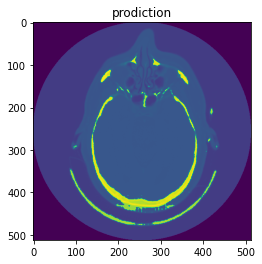

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_37(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 174ms/step


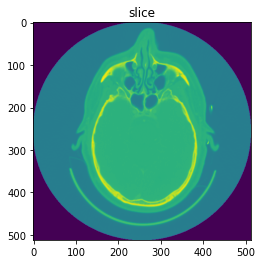

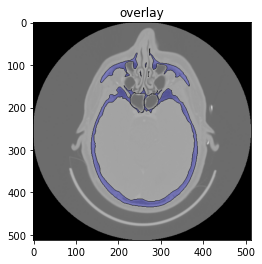

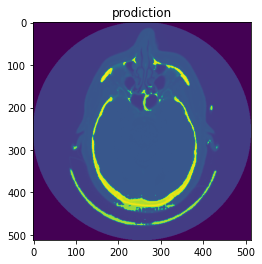

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_38(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 196ms/step


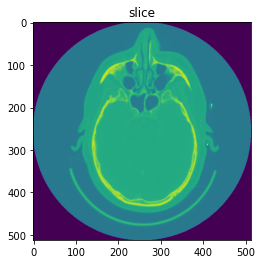

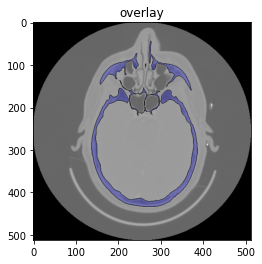

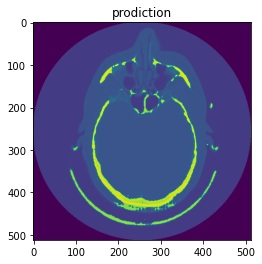

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_39(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 207ms/step


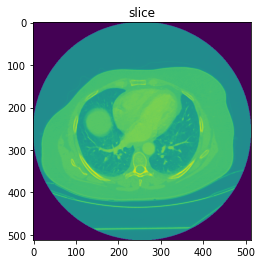

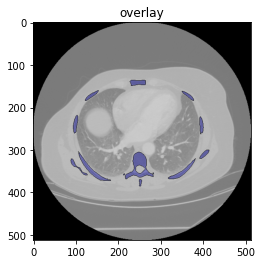

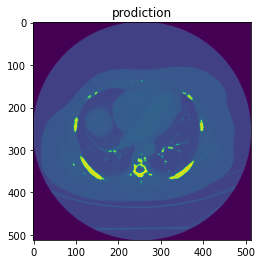

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_40(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 197ms/step


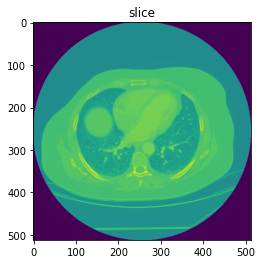

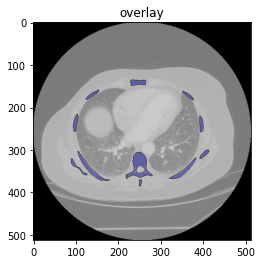

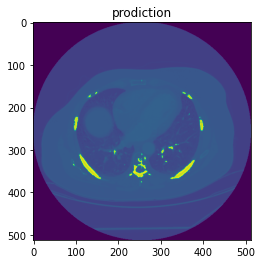

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_41(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 177ms/step


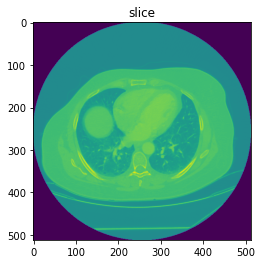

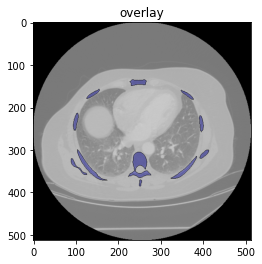

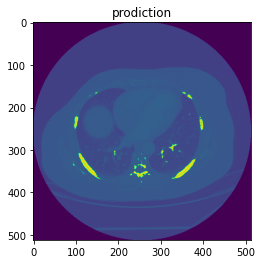

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_42(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_42(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 205ms/step


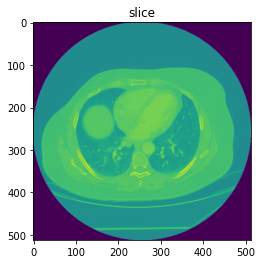

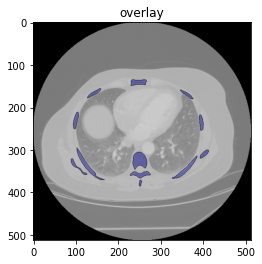

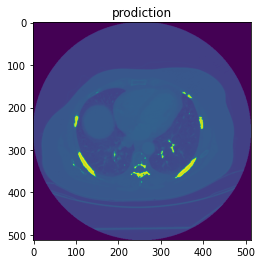

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_43(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_43(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 185ms/step


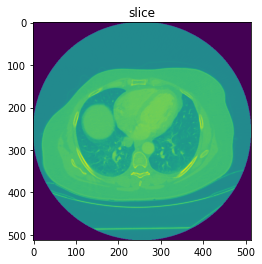

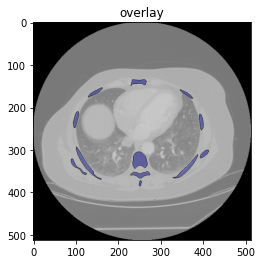

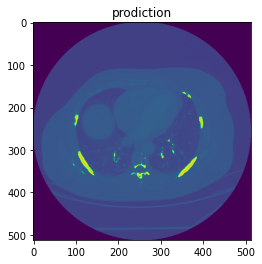

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_44(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_44(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 172ms/step


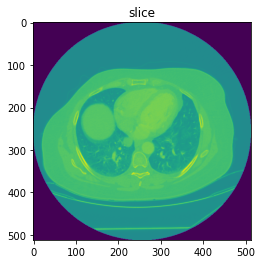

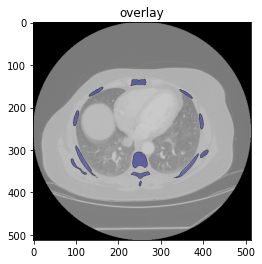

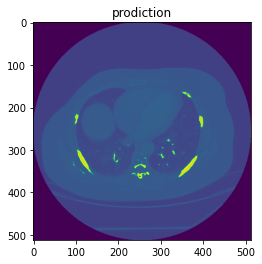

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_45(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_45(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 187ms/step


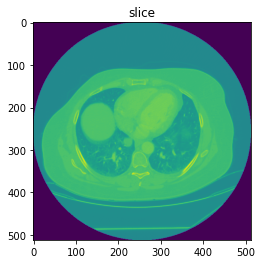

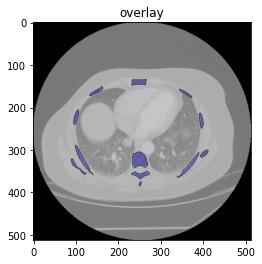

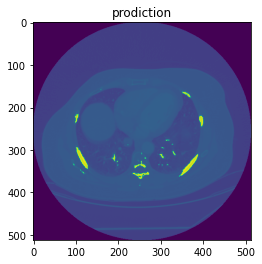

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_46(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_46(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 188ms/step


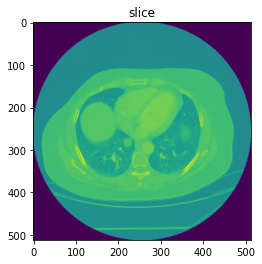

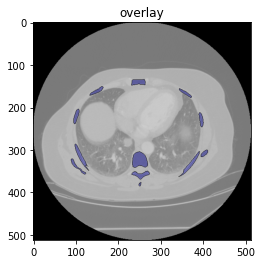

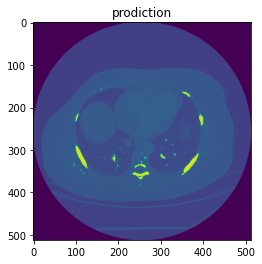

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_47(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_47(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 188ms/step


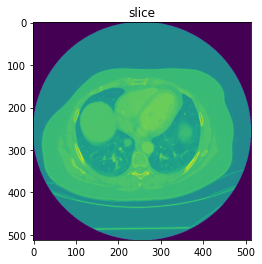

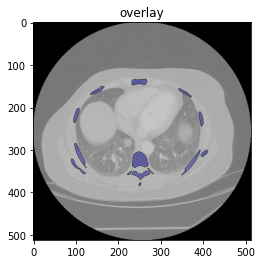

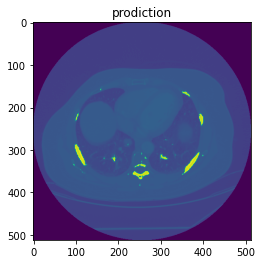

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_48(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_48(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)
1/1 [==============================] - 0s 187ms/step


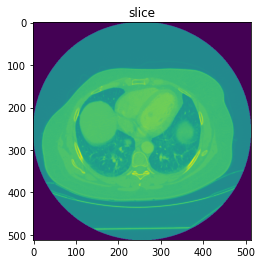

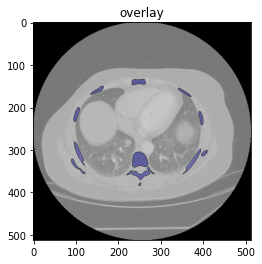

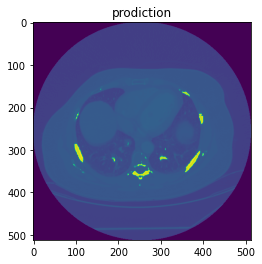

C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:20: UserWarning: result/test/overlay/overlay_49(original).tif is a low contrast image
  skimage.io.imsave(path,image[0])
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
C:\Users\wgh00\AppData\Local\Temp/ipykernel_18524/391155175.py:24: UserWarning: result/test/overlay/overlay_49(pred).jpg is a low contrast image
  skimage.io.imsave(path,pred_mask)
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(1, 512, 512, 1) (512, 512, 1)


In [219]:
#overlay:
o=0;
for element in test_dataset.as_numpy_iterator():
    image,mask =element
    pred_mask = model.predict(image)
    plt.title("slice")
    plt.imshow(im_test_slice_backup[o])
    plt.show()
    plt.title("overlay")
    plt.imshow(im_test_overlay[o])
    plt.show()
    plt.title("prodiction")
    
    pred_mask = create_mask(pred_mask).numpy()*0.1+im_test_slice_backup[o]
    plt.imshow(pred_mask)
    plt.show()
    print(mask.shape,pred_mask.shape)
            
    path="result/test/overlay/overlay_" + str(o) +"(original).tif"
    skimage.io.imsave(path,image[0])
    path="result/test/overlay/overlay_" + str(o) +".jpg"
    skimage.io.imsave(path,mask[0])
    path="result/test/overlay/overlay_" + str(o) +"(pred).jpg"
    skimage.io.imsave(path,pred_mask)
    o+=1